## Roman Molnár a Lukáš Novota
## Podiel práce: 50 / 50

In [19]:
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PowerTransformer
import category_encoders as ce
from sklearn.impute import KNNImputer

In [20]:
filename1 = "63/other_train.csv"
df1_train = pd.read_csv(filename1, sep=',')
df1_train.head()

,Unnamed: 0,name,address,race,marital-status,occupation,pregnant,education-num,relationship,skewness_glucose,...,education,fnlwgt,class,std_glucose,income,medical_info,native-country,hours-per-week,capital-loss,workclass
0,0,Raymond Goode,"10979 Jeffrey Trace\r\nThomastown, WY 01984",White,NaN,Tech-support,f,9.0,Not-in-family,-0.551845,...,NaN,NaN,0.0,52.774565,<=50K,"{'mean_oxygen':'2.220735786','std_oxygen':'13....",United-States,42.0,0.0,Private
1,1,Duane Rust,"172 James Underpass\r\nNorth Daniel, DE 77866",White,Married-civ-spouse,Sales,f,10.0,Husband,0.742840,...,Some-college,205724.0,0.0,51.763432,>50K,"{'mean_oxygen':'15.67809365','std_oxygen':'50....",United-States,24.0,0.0,Private
2,2,Willie Flowers,"403 Snow Spring Apt. 484\r\nJonathanview, NH 9...",White,Married-civ-spouse,Prof-specialty,f,16.0,Husband,0.618000,...,Doctorate,214627.0,1.0,46.480033,>50K,"{'mean_oxygen':'0.8486622070000001','std_oxyge...",United-States,60.0,0.0,Self-emp-inc
3,3,Joseph Brumleve,"8610 Marks Stravenue Apt. 073\r\nNew Michael, ...",White,Divorced,Craft-repair,f,10.0,Own-child,1.716127,...,Some-college,213179.0,0.0,39.304941,>50K,"{'mean_oxygen':'2.877926421','std_oxygen':'18....",United-States,40.0,0.0,Private
4,4,James Barwick,"04945 Rebecca Walks\r\nLake Brett, ND 86641",White,Separated,Other-service,f,4.0,Unmarried,1.183415,...,7th-8th,155701.0,0.0,39.307106,<=50K,"{'mean_oxygen':'1.746655518','std_oxygen':'16....",Peru,38.0,0.0,Private


In [21]:
filename1 = "63/other_valid.csv"
df1_valid = pd.read_csv(filename1, sep=',')
df1_valid.head()

,Unnamed: 0,name,address,race,marital-status,occupation,pregnant,education-num,relationship,skewness_glucose,...,education,fnlwgt,class,std_glucose,income,medical_info,native-country,hours-per-week,capital-loss,workclass
0,0,David Troutman,"851 Burns Isle Suite 672\r\nLake Ericchester, ...",White,Divorced,Machine-op-inspct,f,9.0,Unmarried,-0.024110,...,HS-grad,164423.0,0.0,46.590844,<=50K,"{'mean_oxygen':'1.6613712369999998','std_oxyge...",United-States,40.0,0.0,Private
1,1,Jacob Anderson,"592 Macias Walk\r\nLake Johnberg, KY 14580",White,Married-civ-spouse,Exec-managerial,f,13.0,Husband,-0.162415,...,Bachelors,360096.0,0.0,49.803903,>50K,"{'mean_oxygen':'7.10451505','std_oxygen':'33.5...",United-States,60.0,0.0,Private
2,2,Timothy Perdue,USS George\r\nFPO AP 84200,White,Never-married,Adm-clerical,f,9.0,Other-relative,-0.057502,...,HS-grad,328923.0,0.0,51.078796,<=50K,"{'mean_oxygen':'2.337792642','std_oxygen':'16....",United-States,38.0,0.0,Private
3,3,Susan Martinez,"6129 Baird Plaza\r\nNorth Amanda, OK 40976",White,Never-married,Adm-clerical,f,10.0,Not-in-family,11.959036,...,Some-college,187311.0,1.0,31.991049,<=50K,"{'mean_oxygen':'17.67391304','std_oxygen':'50....",United-States,60.0,0.0,Private
4,4,Winford Shinabery,"2888 Edwards Junctions\r\nPowellside, OK 40550",White,Divorced,Machine-op-inspct,f,9.0,Unmarried,3.205262,...,HS-grad,237943.0,1.0,45.344620,<=50K,"{'mean_oxygen':'1.83277592','std_oxygen':'14.8...",United-States,40.0,1726.0,Private


In [22]:
filename2 = "63/personal_train.csv"
df2_train = pd.read_csv(filename2, sep=',')
df2_train.head()

,Unnamed: 0,name,address,age,sex,date_of_birth
0,0,Roscoe Bohannon,"7183 Osborne Ways Apt. 651\r\nEast Andrew, OH ...",44,Male,1975-10-14
1,1,Ernest Kline,"391 Ball Road Suite 961\r\nFlowersborough, IN ...",51,male,68-08-01
2,2,Harold Hendriks,"8702 Vincent Square\r\nNew Jerryfurt, CO 30614",53,Male,1966-08-13
3,3,Randy Baptiste,"2751 Harris Crossroad\r\nWest Ashley, CA 30311",53,Male,1966-04-08 00 00 00
4,4,Anthony Colucci,"904 Robert Cliffs Suite 186\r\nWest Kyle, CO 7...",66,Female,1953-02-19


In [23]:
filename2 = "63/personal_valid.csv"
df2_valid = pd.read_csv(filename2, sep=',')
df2_valid.head()

,Unnamed: 0,name,address,age,sex,date_of_birth
0,0,Richard Deslauriers,"7910 Rosales Plain Apt. 454\r\nPort Carl, GA 6...",36,Male,83-03-18
1,1,Philip Miller,055 Morgan Plains Suite 225\r\nEast Darrylmout...,55,Female,1963-11-03
2,2,Mitch Wilson,"PSC 7359, Box 2088\r\nAPO AE 62717",71,male,1948-10-10
3,3,James Olsen,USS Allen\r\nFPO AP 87677,52,Male,1967-10-18
4,4,Maurice Riley,"491 Fields Key Suite 544\r\nGracestad, MT 13456",55,Male,1964-05-05


In [24]:
def vymaz_duplikaty(data):
    dups = data.duplicated('name')

    if (dups.any()==True):
        data = data.drop_duplicates('name')
    data = data.reset_index(drop=True)
    return data

In [25]:
df1_train = vymaz_duplikaty(df1_train)
df2_train = vymaz_duplikaty(df2_train)

df1_valid = vymaz_duplikaty(df1_valid)
df2_valid = vymaz_duplikaty(df2_valid)

In [26]:
def joinni_tabulky(data1,data2):
    data1.drop(['Unnamed: 0'], axis=1, inplace=True)
    data2.drop(['Unnamed: 0'], axis=1, inplace=True)
    data = pd.merge(data2,data1,how='left',left_on=['name','address'],right_on=['name','address'])    
    return data

In [27]:
df_train = joinni_tabulky(df1_train,df2_train)
df_valid = joinni_tabulky(df1_valid,df2_valid)

In [28]:
df_train

,name,address,age,sex,date_of_birth,race,marital-status,occupation,pregnant,education-num,...,education,fnlwgt,class,std_glucose,income,medical_info,native-country,hours-per-week,capital-loss,workclass
0,Roscoe Bohannon,"7183 Osborne Ways Apt. 651\r\nEast Andrew, OH ...",44,Male,1975-10-14,White,Never-married,Sales,f,6.0,...,10th,181608.0,0.0,55.728851,<=50K,"{'mean_oxygen':'3.797658863','std_oxygen':'20....",United-States,12.0,0.0,Self-emp-inc
1,Ernest Kline,"391 Ball Road Suite 961\r\nFlowersborough, IN ...",51,male,68-08-01,White,Never-married,Sales,f,13.0,...,Bachelors,361493.0,0.0,49.028790,<=50K,"{'mean_oxygen':'1.97826087','std_oxygen':'18.2...",United-States,40.0,0.0,Private
2,Harold Hendriks,"8702 Vincent Square\r\nNew Jerryfurt, CO 30614",53,Male,1966-08-13,White,Married-civ-spouse,Craft-repair,f,9.0,...,HS-grad,289390.0,0.0,49.337327,<=50K,"{'mean_oxygen':'3.693979933','std_oxygen':'20....",United-States,47.0,0.0,Private
3,Randy Baptiste,"2751 Harris Crossroad\r\nWest Ashley, CA 30311",53,Male,1966-04-08 00 00 00,White,Married-civ-spouse,Protective-serv,f,9.0,...,HS-grad,155781.0,0.0,45.452735,<=50K,"{'mean_oxygen':'2.481605351','std_oxygen':'18....",United-States,50.0,0.0,Local-gov
4,Anthony Colucci,"904 Robert Cliffs Suite 186\r\nWest Kyle, CO 7...",66,Female,1953-02-19,White,Divorced,Exec-managerial,f,10.0,...,Some-college,424012.0,0.0,49.720014,<=50K,"{'mean_oxygen':'1.18729097','std_oxygen':'10.4...",United-States,40.0,0.0,Federal-gov
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3928,Douglas Starkweather,"8582 Lee Roads\r\nCostaburgh, SC 21897",??,Male,1964-06-21 00 00 00,White,Divorced,Transport-moving,f,9.0,...,HS-grad,300777.0,0.0,51.842573,<=50K,"{'mean_oxygen':'1.390468227','std_oxygen':'15....",United-States,70.0,0.0,Self-emp-not-inc
3929,Christopher Winfield,68430 Erik Terrace Suite 279\r\nPort Adamborou...,33,Female,1986-02-09 00:00:00,White,Married-civ-spouse,Sales,f,9.0,...,HS-grad,292590.0,0.0,47.339653,<=50K,"{'mean_oxygen':'7.193143813','std_oxygen':'29....",United-States,25.0,0.0,Private
3930,Salvador Donnell,Unit 8416 Box 3801\r\nDPO AE 31166,-5900,Female,1960-09-04,White,Married-civ-spouse,Adm-clerical,f,9.0,...,HS_grad,343052.0,0.0,50.167471,<=50K,"{'mean_oxygen':'1.852842809','std_oxygen':'12....",United-States,40.0,0.0,Federal-gov
3931,Wesley Goldstein,"34420 Brian Stream\r\nLake Michaeltown, MS 01832",54,Female,04/09/1965,White,Married-civ-spouse,Adm-clerical,FALSE,9.0,...,HS-grad,174391.0,0.0,50.253774,<=50K,"{'mean_oxygen':'5.472408027','std_oxygen':'27....",United-States,40.0,0.0,Self-emp-not-inc


In [29]:
df_train.occupation.unique()

array([' Sales', ' Craft-repair', ' Protective-serv', ' Exec-managerial',
       ' Other-service', ' ?', ' Machine-op-inspct', ' Transport-moving',
       ' Adm-clerical', ' Tech-support', ' Prof-specialty',
       ' Handlers-cleaners', ' Farming-fishing', ' Priv-house-serv', nan,
       ' Armed-Forces'], dtype=object)

In [30]:
df_valid.occupation.unique()

array([' ?', ' Handlers-cleaners', ' Prof-specialty', ' Adm-clerical',
       ' Exec-managerial', ' Machine-op-inspct', ' Craft-repair',
       ' Sales', ' Priv-house-serv', ' Other-service', ' Tech-support',
       ' Protective-serv', ' Transport-moving', ' Farming-fishing', nan],
      dtype=object)

In [31]:
df_train['marital-status'].unique()

array([' Never-married', ' Married-civ-spouse', ' Divorced', ' Widowed',
       ' Separated', nan, ' Married-spouse-absent', ' Married-AF-spouse'],
      dtype=object)

In [32]:
df_valid['marital-status'].unique()

array([' Never-married', ' Married-civ-spouse', ' Divorced', ' Separated',
       ' Widowed', ' Married-spouse-absent', nan, ' Married-AF-spouse'],
      dtype=object)

In [33]:
df_valid

,name,address,age,sex,date_of_birth,race,marital-status,occupation,pregnant,education-num,...,education,fnlwgt,class,std_glucose,income,medical_info,native-country,hours-per-week,capital-loss,workclass
0,Richard Deslauriers,"7910 Rosales Plain Apt. 454\r\nPort Carl, GA 6...",36,Male,83-03-18,White,Never-married,?,f,12.0,...,Assoc-acdm,327120.0,0.0,52.927757,<=50K,"{'mean_oxygen':'16.33779264','std_oxygen':'49....",United-States,55.0,0.0,?
1,Philip Miller,055 Morgan Plains Suite 225\r\nEast Darrylmout...,55,Female,1963-11-03,White,Married-civ-spouse,Handlers-cleaners,t,13.0,...,Bachelors,99065.0,0.0,47.148028,>50K,"{'mean_oxygen':'3.781772575','std_oxygen':'22....",Poland,40.0,0.0,Private
2,Mitch Wilson,"PSC 7359, Box 2088\r\nAPO AE 62717",71,male,1948-10-10,White,Married-civ-spouse,Prof-specialty,f,9.0,...,HS-grad,340787.0,1.0,30.397172,<=50K,"{'mean_oxygen':'30.02173913','std_oxygen':'53....",United-States,40.0,0.0,Private
3,James Olsen,USS Allen\r\nFPO AP 87677,52,Male,1967-10-18,White,Married-civ-spouse,Adm-clerical,f,14.0,...,Masters,318450.0,0.0,44.480791,>50K,"{'mean_oxygen':'3.398829431','std_oxygen':'18....",United-States,80.0,0.0,Private
4,Maurice Riley,"491 Fields Key Suite 544\r\nGracestad, MT 13456",55,Male,1964-05-05,White,Married-civ-spouse,Exec-managerial,f,10.0,...,Some-college,257200.0,0.0,35.425875,>50K,"{'mean_oxygen':'1.465719064','std_oxygen':'13....",United-States,40.0,0.0,Self-emp-inc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1306,Peter Brown,"35892 Robert Forest Apt. 556\r\nRubioside, AL ...",34,Male,1985/02/14,White,Married-civ-spouse,Machine-op-inspct,f,9.0,...,HS-grad,293291.0,0.0,52.997015,>50K,"{'mean_oxygen':'6.3135451510000005','std_oxyge...",United-States,50.0,0.0,Private
1307,King Andrews,"53981 Taylor Brook\r\nBarkerville, TN 17001",5700,Male,1962-01-26,White,Married-civ-spouse,Prof-specialty,f,13.0,...,Bachelors,57600.0,0.0,42.295068,<=50K,"{'mean_oxygen':'8.614548495','std_oxygen':'33....",United-States,40.0,0.0,Private
1308,Scott Bernal,"847 Jamie Cove Apt. 464\r\nCummingsview, RI 90999",57,Female,1962-05-20,White,Never-married,Exec-managerial,F,10.0,...,Some-college,180262.0,0.0,52.352321,<=50K,"{'mean_oxygen':'1.357859532','std_oxygen':'10....",United-States,40.0,0.0,Private
1309,Keith Munoz,"159 Yvonne Way Suite 696\r\nWest Ashleyton, LA...",59,Female,1960-09-06,White,Never-married,Exec-managerial,f,9.0,...,HS-grad,205706.0,1.0,47.423329,<=50K,"{'mean_oxygen':'132.5819398','std_oxygen':'71....",United-States,40.0,0.0,Private


In [34]:
def uprav_adresu(data):
    data['address'] = data['address'].str.replace('\r\n', ', ')
    return data

df_train = uprav_adresu(df_train)
df_valid = uprav_adresu(df_valid)
df_valid['address']

0        7910 Rosales Plain Apt. 454, Port Carl, GA 69839
1       055 Morgan Plains Suite 225, East Darrylmouth,...
2                        PSC 7359, Box 2088, APO AE 62717
3                                 USS Allen, FPO AP 87677
4           491 Fields Key Suite 544, Gracestad, MT 13456
                              ...                        
1306    35892 Robert Forest Apt. 556, Rubioside, AL 36512
1307            53981 Taylor Brook, Barkerville, TN 17001
1308      847 Jamie Cove Apt. 464, Cummingsview, RI 90999
1309    159 Yvonne Way Suite 696, West Ashleyton, LA 4...
1310    05550 Mahoney Crest Apt. 037, Grahammouth, MO ...
Name: address, Length: 1311, dtype: object

In [35]:
def uprav_pohlavie(data):
    data['sex'] = data['sex'].str.strip()
    data['sex'] = data['sex'].str.replace('male', 'Male')
    data['sex'] = data['sex'].str.replace('feMale', 'Female')
    data['sex'] = data['sex'].str.replace('FeMale', 'Female')
    return data

df_train = uprav_pohlavie(df_train)
df_valid = uprav_pohlavie(df_valid)
df_valid['sex']

0         Male
1       Female
2         Male
3         Male
4         Male
         ...  
1306      Male
1307      Male
1308    Female
1309    Female
1310      Male
Name: sex, Length: 1311, dtype: object

In [36]:
def uprav_tehotna(data):
    data['pregnant'] = data['pregnant'].str.replace('f', 'F')
    data['pregnant'] = data['pregnant'].str.replace('FALSE', 'F')
    data['pregnant'] = data['pregnant'].str.replace('t', 'T')
    data['pregnant'] = data['pregnant'].str.replace('TRUE', 'T')
    return data

df_train = uprav_tehotna(df_train)
df_valid = uprav_tehotna(df_valid)
df_valid['pregnant']

0       F
1       T
2       F
3       F
4       F
       ..
1306    F
1307    F
1308    F
1309    F
1310    F
Name: pregnant, Length: 1311, dtype: object

In [37]:
def uprav_datum(data):
    data['date_of_birth'] = data['date_of_birth'].str.split().str[0]
    data['date_of_birth'] = data['date_of_birth'].apply(lambda x: pd.to_datetime(x).strftime('%Y-%m-%d'))
    for i in data['date_of_birth']:
        if int(i[:4]) > 2019:
            pom = i.replace(i[:2], '19')
            data['date_of_birth'] = data['date_of_birth'].replace(i, pom)

    return data

df_train = uprav_datum(df_train)
df_valid = uprav_datum(df_valid)
df_valid['date_of_birth']

0       1983-03-18
1       1963-11-03
2       1948-10-10
3       1967-10-18
4       1964-05-05
           ...    
1306    1985-02-14
1307    1962-01-26
1308    1962-05-20
1309    1960-09-06
1310    1978-06-25
Name: date_of_birth, Length: 1311, dtype: object

In [38]:
def uprav_medical_info(data):
    data['medical_info'].fillna( method ='ffill', inplace = True)
    df = pd.DataFrame(columns = ['mean_oxygen', 'std_oxygen', 'kurtosis_oxygen', 'skewness_oxygen'])
    for i in range(len(data)):
        asd = data['medical_info'][i]
        asd = asd.replace("'","")
        asd = asd.replace("{","")
        asd = asd.replace("}","")
        asd = asd.replace("mean_oxygen:","")
        asd = asd.replace("std_oxygen:","")
        asd = asd.replace("kurtosis_oxygen:","")
        asd = asd.replace("skewness_oxygen:","")
        asd = asd.split(',')
        df2 = pd.DataFrame(asd, columns = [i])
        df2 = df2.transpose()
        df2.columns = ['mean_oxygen', 'std_oxygen', 'kurtosis_oxygen', 'skewness_oxygen']
        df = df.append(df2) 
        
    data.drop(['medical_info'], axis=1, inplace=True)
    data = data.join(df)
    return data


df_train = uprav_medical_info(df_train)
df_valid = uprav_medical_info(df_valid)
df_valid

,name,address,age,sex,date_of_birth,race,marital-status,occupation,pregnant,education-num,...,std_glucose,income,native-country,hours-per-week,capital-loss,workclass,mean_oxygen,std_oxygen,kurtosis_oxygen,skewness_oxygen
0,Richard Deslauriers,"7910 Rosales Plain Apt. 454, Port Carl, GA 69839",36,Male,1983-03-18,White,Never-married,?,F,12.0,...,52.927757,<=50K,United-States,55.0,0.0,?,16.33779264,49.78517002,3.03781641,8.04895334
1,Philip Miller,"055 Morgan Plains Suite 225, East Darrylmouth,...",55,Female,1963-11-03,White,Married-civ-spouse,Handlers-cleaners,T,13.0,...,47.148028,>50K,Poland,40.0,0.0,Private,3.781772575,22.06220384,6.9676732470000005,53.62233903
2,Mitch Wilson,"PSC 7359, Box 2088, APO AE 62717",71,Male,1948-10-10,White,Married-civ-spouse,Prof-specialty,F,9.0,...,30.397172,<=50K,United-States,40.0,0.0,Private,30.02173913,53.40027929,2.135822594,4.428893663999999
3,James Olsen,"USS Allen, FPO AP 87677",52,Male,1967-10-18,White,Married-civ-spouse,Adm-clerical,F,14.0,...,44.480791,>50K,United-States,80.0,0.0,Private,3.398829431,18.02874791,7.03206409,60.39062437
4,Maurice Riley,"491 Fields Key Suite 544, Gracestad, MT 13456",55,Male,1964-05-05,White,Married-civ-spouse,Exec-managerial,F,10.0,...,35.425875,>50K,United-States,40.0,0.0,Self-emp-inc,1.465719064,13.89544073,11.90624204,162.08120280000003
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1306,Peter Brown,"35892 Robert Forest Apt. 556, Rubioside, AL 36512",34,Male,1985-02-14,White,Married-civ-spouse,Machine-op-inspct,F,9.0,...,52.997015,>50K,United-States,50.0,0.0,Private,6.3135451510000005,28.93374713,4.9575141480000005,25.54986465
1307,King Andrews,"53981 Taylor Brook, Barkerville, TN 17001",5700,Male,1962-01-26,White,Married-civ-spouse,Prof-specialty,F,13.0,...,42.295068,<=50K,United-States,40.0,0.0,Private,8.614548495,33.80582596,4.353402537,19.49343398
1308,Scott Bernal,"847 Jamie Cove Apt. 464, Cummingsview, RI 90999",57,Female,1962-05-20,White,Never-married,Exec-managerial,F,10.0,...,52.352321,<=50K,United-States,40.0,0.0,Private,1.357859532,10.96752717,14.70379481,279.85495489999994
1309,Keith Munoz,"159 Yvonne Way Suite 696, West Ashleyton, LA 4...",59,Female,1960-09-06,White,Never-married,Exec-managerial,F,9.0,...,47.423329,<=50K,United-States,40.0,0.0,Private,132.5819398,71.87268664,-0.473744206,-0.478413851


In [39]:
def oxygen_to_numeric(data):
    data['mean_oxygen'] = pd.to_numeric(data['mean_oxygen'], errors='coerce')
    data['std_oxygen'] = pd.to_numeric(data['std_oxygen'], errors='coerce')
    data['skewness_oxygen'] = pd.to_numeric(data['skewness_oxygen'], errors='coerce')
    data['kurtosis_oxygen'] = pd.to_numeric(data['kurtosis_oxygen'], errors='coerce')
    
    return data

df_train = oxygen_to_numeric(df_train)
df_valid = oxygen_to_numeric(df_valid)
df_valid

,name,address,age,sex,date_of_birth,race,marital-status,occupation,pregnant,education-num,...,std_glucose,income,native-country,hours-per-week,capital-loss,workclass,mean_oxygen,std_oxygen,kurtosis_oxygen,skewness_oxygen
0,Richard Deslauriers,"7910 Rosales Plain Apt. 454, Port Carl, GA 69839",36,Male,1983-03-18,White,Never-married,?,F,12.0,...,52.927757,<=50K,United-States,55.0,0.0,?,16.337793,49.785170,3.037816,8.048953
1,Philip Miller,"055 Morgan Plains Suite 225, East Darrylmouth,...",55,Female,1963-11-03,White,Married-civ-spouse,Handlers-cleaners,T,13.0,...,47.148028,>50K,Poland,40.0,0.0,Private,3.781773,22.062204,6.967673,53.622339
2,Mitch Wilson,"PSC 7359, Box 2088, APO AE 62717",71,Male,1948-10-10,White,Married-civ-spouse,Prof-specialty,F,9.0,...,30.397172,<=50K,United-States,40.0,0.0,Private,30.021739,53.400279,2.135823,4.428894
3,James Olsen,"USS Allen, FPO AP 87677",52,Male,1967-10-18,White,Married-civ-spouse,Adm-clerical,F,14.0,...,44.480791,>50K,United-States,80.0,0.0,Private,3.398829,18.028748,7.032064,60.390624
4,Maurice Riley,"491 Fields Key Suite 544, Gracestad, MT 13456",55,Male,1964-05-05,White,Married-civ-spouse,Exec-managerial,F,10.0,...,35.425875,>50K,United-States,40.0,0.0,Self-emp-inc,1.465719,13.895441,11.906242,162.081203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1306,Peter Brown,"35892 Robert Forest Apt. 556, Rubioside, AL 36512",34,Male,1985-02-14,White,Married-civ-spouse,Machine-op-inspct,F,9.0,...,52.997015,>50K,United-States,50.0,0.0,Private,6.313545,28.933747,4.957514,25.549865
1307,King Andrews,"53981 Taylor Brook, Barkerville, TN 17001",5700,Male,1962-01-26,White,Married-civ-spouse,Prof-specialty,F,13.0,...,42.295068,<=50K,United-States,40.0,0.0,Private,8.614548,33.805826,4.353403,19.493434
1308,Scott Bernal,"847 Jamie Cove Apt. 464, Cummingsview, RI 90999",57,Female,1962-05-20,White,Never-married,Exec-managerial,F,10.0,...,52.352321,<=50K,United-States,40.0,0.0,Private,1.357860,10.967527,14.703795,279.854955
1309,Keith Munoz,"159 Yvonne Way Suite 696, West Ashleyton, LA 4...",59,Female,1960-09-06,White,Never-married,Exec-managerial,F,9.0,...,47.423329,<=50K,United-States,40.0,0.0,Private,132.581940,71.872687,-0.473744,-0.478414


<ipython-input-40-81890abd5c5d>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['age'][i] = vek


<AxesSubplot:xlabel='age', ylabel='Count'>

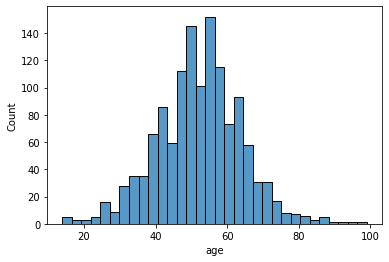

In [40]:
def vypocet_veku(data):
    for i in range(len(data)):
        rok = data['date_of_birth'][i]
        rok = rok[:4]
        vek = 2019-int(rok)
        if(vek<0): vek = 0
        data['age'][i] = vek
    
    return data

df_train = vypocet_veku(df_train)
df_valid = vypocet_veku(df_valid)
sns.histplot(df_valid['age'])

In [41]:
def knn_nahradenie(data):
    imputer = KNNImputer(n_neighbors=5)
    data = data.to_frame()
    data = pd.DataFrame(imputer.fit_transform(data),columns = data.columns)
    
    return data

In [42]:
def naplnenie_chybajucich_hodnot(data):
    # Naplnenie hodnôt podľa posledného riadku
    data["race"].fillna( method ='ffill', inplace = True)
    data["marital-status"].fillna( method ='ffill', inplace = True)
    data["occupation"].fillna( method ='ffill', inplace = True)
    data["pregnant"].fillna( 'F', inplace = True)
    data["relationship"].fillna( method ='ffill', inplace = True)
    data["education"].fillna( method ='ffill', inplace = True)
    data["class"].fillna( method ='ffill', inplace = True)
    data["income"].fillna( method ='ffill', inplace = True)
    data["native-country"].fillna( method ='ffill', inplace = True)
    data["workclass"].fillna( method ='ffill', inplace = True)
    # Naplnenie priemerom okolitych hodnot
    data["education-num"] = knn_nahradenie(data["education-num"])
    data["capital-gain"] = knn_nahradenie(data["capital-gain"])
    data["capital-loss"] = knn_nahradenie(data["capital-loss"])
    data["hours-per-week"] = knn_nahradenie(data["hours-per-week"])
    # Naplnenie hodnôt priemerom
    data['fnlwgt'].fillna(data['fnlwgt'].mean(), inplace = True)
    data['skewness_glucose'].fillna(data['skewness_glucose'].mean(), inplace = True)
    data['mean_glucose'].fillna(data['mean_glucose'].mean(), inplace = True)
    data['std_glucose'].fillna(data['std_glucose'].mean(), inplace = True)
    data['kurtosis_glucose'].fillna(data['kurtosis_glucose'].mean(), inplace = True)
    
    return data

In [43]:
df_train = naplnenie_chybajucich_hodnot(df_train)
df_valid = naplnenie_chybajucich_hodnot(df_valid)
df_valid.isnull().sum()
df_valid.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1311 entries, 0 to 1310
Data columns (total 28 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              1311 non-null   object 
 1   address           1311 non-null   object 
 2   age               1311 non-null   object 
 3   sex               1311 non-null   object 
 4   date_of_birth     1311 non-null   object 
 5   race              1311 non-null   object 
 6   marital-status    1311 non-null   object 
 7   occupation        1311 non-null   object 
 8   pregnant          1311 non-null   object 
 9   education-num     1311 non-null   float64
 10  relationship      1311 non-null   object 
 11  skewness_glucose  1311 non-null   float64
 12  mean_glucose      1311 non-null   float64
 13  capital-gain      1311 non-null   float64
 14  kurtosis_glucose  1311 non-null   float64
 15  education         1311 non-null   object 
 16  fnlwgt            1311 non-null   float64


In [44]:
def vychylene_hodnoty(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1  
    
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    
    for i in data:
        if i < lower:
            data = data.replace(i, lower)
        elif i > upper:
            data = data.replace(i, upper)
            
    return data

In [45]:
def nahradenie_vsetkych_outlierov(data):
    data['hours-per-week'] = vychylene_hodnoty(data['hours-per-week'])
    data['fnlwgt'] = vychylene_hodnoty(data['fnlwgt'])
    data['skewness_glucose'] = vychylene_hodnoty(data['skewness_glucose'])
    data['mean_glucose'] = vychylene_hodnoty(data['mean_glucose'])
    data['kurtosis_glucose'] = vychylene_hodnoty(data['kurtosis_glucose'])
    data['std_glucose'] = vychylene_hodnoty(data['std_glucose'])
    data['mean_oxygen'] = vychylene_hodnoty(data['mean_oxygen'])
    data['std_oxygen'] = vychylene_hodnoty(data['std_oxygen'])
    data['skewness_oxygen'] = vychylene_hodnoty(data['skewness_oxygen'])
    data['kurtosis_oxygen'] = vychylene_hodnoty(data['kurtosis_oxygen'])
    
    return data

In [46]:
df_train = nahradenie_vsetkych_outlierov(df_train)
df_valid = nahradenie_vsetkych_outlierov(df_valid)
df_valid.head()

,name,address,age,sex,date_of_birth,race,marital-status,occupation,pregnant,education-num,...,std_glucose,income,native-country,hours-per-week,capital-loss,workclass,mean_oxygen,std_oxygen,kurtosis_oxygen,skewness_oxygen
0,Richard Deslauriers,"7910 Rosales Plain Apt. 454, Port Carl, GA 69839",36,Male,1983-03-18,White,Never-married,?,F,12.0,...,52.927757,<=50K,United-States,55.0,0.0,?,16.337793,49.785170,3.037816,8.048953
1,Philip Miller,"055 Morgan Plains Suite 225, East Darrylmouth,...",56,Female,1963-11-03,White,Married-civ-spouse,Handlers-cleaners,T,13.0,...,47.148028,>50K,Poland,40.0,0.0,Private,3.781773,22.062204,6.967673,53.622339
2,Mitch Wilson,"PSC 7359, Box 2088, APO AE 62717",71,Male,1948-10-10,White,Married-civ-spouse,Prof-specialty,F,9.0,...,30.397172,<=50K,United-States,40.0,0.0,Private,30.021739,53.400279,2.135823,4.428894
3,James Olsen,"USS Allen, FPO AP 87677",52,Male,1967-10-18,White,Married-civ-spouse,Adm-clerical,F,14.0,...,44.480791,>50K,United-States,55.5,0.0,Private,3.398829,18.028748,7.032064,60.390624
4,Maurice Riley,"491 Fields Key Suite 544, Gracestad, MT 13456",55,Male,1964-05-05,White,Married-civ-spouse,Exec-managerial,F,10.0,...,35.425875,>50K,United-States,40.0,0.0,Self-emp-inc,1.465719,13.895441,11.906242,162.081203


<ipython-input-47-e14c0d082abb>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['skewness_glucose'][i] = glucose[i][0]
<ipython-input-47-e14c0d082abb>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['mean_glucose'][i] = glucose[i][1]
<ipython-input-47-e14c0d082abb>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['kurtosis_glucose'][i] = glucose[i][2]
<ipython-input-47-e14c0d082abb>:10: SettingWithCopyWarning: 
A value

array([[<AxesSubplot:title={'center':'skewness_glucose'}>,
        <AxesSubplot:title={'center':'mean_glucose'}>],
       [<AxesSubplot:title={'center':'kurtosis_glucose'}>,
        <AxesSubplot:title={'center':'std_glucose'}>]], dtype=object)

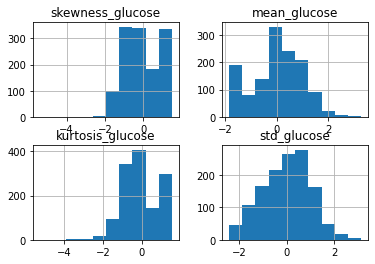

In [47]:
def power_transform_glucose(data):
    glucose = data[["skewness_glucose", "mean_glucose", "kurtosis_glucose", "std_glucose"]].to_numpy()
    pt = PowerTransformer(method='yeo-johnson')
    glucose = pt.fit_transform(glucose)

    for i in range(len(data)):
        data['skewness_glucose'][i] = glucose[i][0]
        data['mean_glucose'][i] = glucose[i][1]    
        data['kurtosis_glucose'][i] = glucose[i][2]
        data['std_glucose'][i] = glucose[i][3]
    
    return data

df_train = power_transform_glucose(df_train)
df_valid = power_transform_glucose(df_valid)
df_valid[['skewness_glucose', 'mean_glucose', 'kurtosis_glucose', 'std_glucose']].hist()

<ipython-input-48-c832f69a363c>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['skewness_oxygen'][i] = oxygen[i][0]
<ipython-input-48-c832f69a363c>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['mean_oxygen'][i] = oxygen[i][1]
<ipython-input-48-c832f69a363c>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['kurtosis_oxygen'][i] = oxygen[i][2]
<ipython-input-48-c832f69a363c>:10: SettingWithCopyWarning: 
A value is tr

array([[<AxesSubplot:title={'center':'skewness_oxygen'}>,
        <AxesSubplot:title={'center':'mean_oxygen'}>],
       [<AxesSubplot:title={'center':'kurtosis_oxygen'}>,
        <AxesSubplot:title={'center':'std_oxygen'}>]], dtype=object)

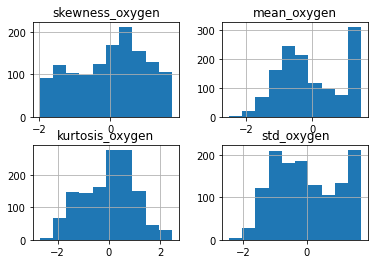

In [48]:
def power_transform_oxygen(data):
    oxygen = data[['skewness_oxygen', 'mean_oxygen', 'kurtosis_oxygen', 'std_oxygen']].to_numpy()
    pt = PowerTransformer(method='yeo-johnson')
    oxygen = pt.fit_transform(oxygen)

    for i in range(len(data)):
        data['skewness_oxygen'][i] = oxygen[i][0]
        data['mean_oxygen'][i] = oxygen[i][1]    
        data['kurtosis_oxygen'][i] = oxygen[i][2]
        data['std_oxygen'][i] = oxygen[i][3]
        
    return data    

df_train = power_transform_oxygen(df_train)
df_valid = power_transform_oxygen(df_valid)
df_valid[['skewness_oxygen', 'mean_oxygen', 'kurtosis_oxygen', 'std_oxygen']].hist()

In [49]:
def encoder(data):
    ce_ordinal = ce.OrdinalEncoder(cols=['sex', 'race', 'pregnant', 'marital-status', 'occupation', 'relationship', 'income', 'native-country', 'workclass'])
    
    return ce_ordinal.fit_transform(data)

In [50]:
class DataframeFunctionTransformer():
    def __init__(self, func):
        self.func = func

    def transform(self, input_df, **transform_params):
        return self.func(input_df)

    def fit(self, X, y=None, **fit_params):
        return self

In [51]:
pipe = Pipeline([('adresa', DataframeFunctionTransformer(uprav_adresu)),
                ('pohlavie', DataframeFunctionTransformer(uprav_pohlavie)),
                ('tehotna', DataframeFunctionTransformer(uprav_tehotna)),
                ('datum', DataframeFunctionTransformer(uprav_datum)),
                ('medical_info', DataframeFunctionTransformer(uprav_medical_info)),
                ('oxygen_numeric', DataframeFunctionTransformer(oxygen_to_numeric)),
                ('vek', DataframeFunctionTransformer(vypocet_veku)),
                ('chybajuce_hodnoty', DataframeFunctionTransformer(naplnenie_chybajucich_hodnot)),
                ('outliers', DataframeFunctionTransformer(nahradenie_vsetkych_outlierov)),
                ('glucose', DataframeFunctionTransformer(power_transform_glucose)),
                ('oxygen', DataframeFunctionTransformer(power_transform_oxygen)),
                ('encoder', DataframeFunctionTransformer(encoder))])

In [52]:
df_train_check = pd.merge(df2_train,df1_train,how='left',left_on=['name','address'],right_on=['name','address'])
df_valid_check = pd.merge(df2_valid,df1_valid,how='left',left_on=['name','address'],right_on=['name','address'])

In [53]:
processed_data_train = pipe.fit_transform(df_train_check)
processed_data_valid = pipe.fit_transform(df_valid_check)

<ipython-input-40-81890abd5c5d>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['age'][i] = vek
<ipython-input-47-e14c0d082abb>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['skewness_glucose'][i] = glucose[i][0]
<ipython-input-47-e14c0d082abb>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['mean_glucose'][i] = glucose[i][1]
<ipython-input-47-e14c0d082abb>:9: SettingWithCopyWarning: 
A value is trying to be set on 

In [54]:
processed_data_train_df = pd.DataFrame(processed_data_train)
processed_data_train_df

,name,address,age,sex,date_of_birth,race,marital-status,occupation,pregnant,education-num,...,std_glucose,income,native-country,hours-per-week,capital-loss,workclass,mean_oxygen,std_oxygen,kurtosis_oxygen,skewness_oxygen
0,Roscoe Bohannon,"7183 Osborne Ways Apt. 651, East Andrew, OH 53211",44,1,1975-10-14,1,1,1,1,6.0,...,1.476628,1,1,32.5,0.0,1,-0.081379,-0.190130,0.025765,0.067729
1,Ernest Kline,"391 Ball Road Suite 961, Flowersborough, IN 57550",51,1,1968-08-01,1,1,1,1,13.0,...,0.502971,1,1,40.0,0.0,2,-0.787782,-0.399843,0.549108,0.472478
2,Harold Hendriks,"8702 Vincent Square, New Jerryfurt, CO 30614",53,1,1966-08-13,1,2,2,1,9.0,...,0.546566,1,1,47.0,0.0,2,-0.110214,-0.208312,0.053238,0.084095
3,Randy Baptiste,"2751 Harris Crossroad, West Ashley, CA 30311",53,1,1966-04-08,1,2,3,1,9.0,...,0.006751,1,1,50.0,0.0,3,-0.537731,-0.373527,0.550355,0.551033
4,Anthony Colucci,"904 Robert Cliffs Suite 186, West Kyle, CO 77139",66,2,1953-02-19,1,3,4,1,10.0,...,0.600809,1,1,40.0,0.0,4,-1.343095,-1.643365,1.607601,1.741088
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3928,Douglas Starkweather,"8582 Lee Roads, Costaburgh, SC 21897",55,1,1964-06-21,1,3,8,1,9.0,...,0.905048,1,1,52.5,0.0,5,-1.174461,-0.796977,1.013548,0.964303
3929,Christopher Winfield,"68430 Erik Terrace Suite 279, Port Adamborough...",33,2,1986-02-09,1,2,1,1,9.0,...,0.266487,1,1,32.5,0.0,2,0.535360,0.424213,-0.427302,-0.439776
3930,Salvador Donnell,"Unit 8416 Box 3801, DPO AE 31166",59,2,1960-09-04,1,2,9,1,9.0,...,0.664470,1,1,40.0,0.0,4,-0.860160,-1.207827,0.797040,1.016163
3931,Wesley Goldstein,"34420 Brian Stream, Lake Michaeltown, MS 01832",54,2,1965-04-09,1,2,9,1,9.0,...,0.676778,1,1,40.0,0.0,5,0.283788,0.306849,-0.220582,-0.241575


In [55]:
processed_data_valid_df = pd.DataFrame(processed_data_valid)
processed_data_valid_df

,name,address,age,sex,date_of_birth,race,marital-status,occupation,pregnant,education-num,...,std_glucose,income,native-country,hours-per-week,capital-loss,workclass,mean_oxygen,std_oxygen,kurtosis_oxygen,skewness_oxygen
0,Richard Deslauriers,"7910 Rosales Plain Apt. 454, Port Carl, GA 69839",36,1,1983-03-18,1,1,1,1,12.0,...,1.113232,1,1,55.0,0.0,1,1.043211,1.045551,-0.820179,-0.886093
1,Philip Miller,"055 Morgan Plains Suite 225, East Darrylmouth,...",56,2,1963-11-03,1,2,2,2,13.0,...,0.285308,2,2,40.0,0.0,2,-0.164647,-0.118315,0.052375,0.048936
2,Mitch Wilson,"PSC 7359, Box 2088, APO AE 62717",71,1,1948-10-10,1,2,3,1,9.0,...,-1.827539,1,1,40.0,0.0,2,1.396509,1.127329,-1.052948,-1.061426
3,James Olsen,"USS Allen, FPO AP 87677",52,1,1967-10-18,1,2,4,1,14.0,...,-0.080549,2,1,55.5,0.0,2,-0.269927,-0.476144,0.065379,0.132298
4,Maurice Riley,"491 Fields Key Suite 544, Gracestad, MT 13456",55,1,1964-05-05,1,2,5,1,10.0,...,-1.241188,2,1,40.0,0.0,3,-1.120468,-0.983246,0.975712,0.979334
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1306,Peter Brown,"35892 Robert Forest Apt. 556, Rubioside, AL 36512",34,1,1985-02-14,1,2,6,1,9.0,...,1.123437,2,1,50.0,0.0,2,0.313725,0.316573,-0.371704,-0.397284
1307,King Andrews,"53981 Taylor Brook, Barkerville, TN 17001",57,1,1962-01-26,1,2,3,1,13.0,...,-0.372438,1,1,40.0,0.0,2,0.576414,0.543975,-0.507313,-0.532059
1308,Scott Bernal,"847 Jamie Cove Apt. 464, Cummingsview, RI 90999",57,2,1962-05-20,1,1,5,1,10.0,...,1.028704,1,1,40.0,0.0,2,-1.195940,-1.490504,1.449421,1.591006
1309,Keith Munoz,"159 Yvonne Way Suite 696, West Ashleyton, LA 4...",59,2,1960-09-06,1,1,5,1,9.0,...,0.323664,1,1,40.0,0.0,2,1.491692,1.446009,-1.908770,-1.558431


In [56]:
processed_data_train_df.to_csv('processed_data_train.csv', index=False)
processed_data_valid_df.to_csv('processed_data_valid.csv', index=False)

In [57]:
processed_train = "processed_data_train.csv"
dfP_train = pd.read_csv(processed_train)
dfP_train.head()

,name,address,age,sex,date_of_birth,race,marital-status,occupation,pregnant,education-num,...,std_glucose,income,native-country,hours-per-week,capital-loss,workclass,mean_oxygen,std_oxygen,kurtosis_oxygen,skewness_oxygen
0,Roscoe Bohannon,"7183 Osborne Ways Apt. 651, East Andrew, OH 53211",44,1,1975-10-14,1,1,1,1,6.0,...,1.476628,1,1,32.5,0.0,1,-0.081379,-0.190130,0.025765,0.067729
1,Ernest Kline,"391 Ball Road Suite 961, Flowersborough, IN 57550",51,1,1968-08-01,1,1,1,1,13.0,...,0.502971,1,1,40.0,0.0,2,-0.787782,-0.399843,0.549108,0.472478
2,Harold Hendriks,"8702 Vincent Square, New Jerryfurt, CO 30614",53,1,1966-08-13,1,2,2,1,9.0,...,0.546566,1,1,47.0,0.0,2,-0.110214,-0.208312,0.053238,0.084095
3,Randy Baptiste,"2751 Harris Crossroad, West Ashley, CA 30311",53,1,1966-04-08,1,2,3,1,9.0,...,0.006751,1,1,50.0,0.0,3,-0.537731,-0.373527,0.550355,0.551033
4,Anthony Colucci,"904 Robert Cliffs Suite 186, West Kyle, CO 77139",66,2,1953-02-19,1,3,4,1,10.0,...,0.600809,1,1,40.0,0.0,4,-1.343095,-1.643365,1.607601,1.741088


In [58]:
processed_valid = "processed_data_valid.csv"
dfP_valid = pd.read_csv(processed_valid)
dfP_valid.head()

,name,address,age,sex,date_of_birth,race,marital-status,occupation,pregnant,education-num,...,std_glucose,income,native-country,hours-per-week,capital-loss,workclass,mean_oxygen,std_oxygen,kurtosis_oxygen,skewness_oxygen
0,Richard Deslauriers,"7910 Rosales Plain Apt. 454, Port Carl, GA 69839",36,1,1983-03-18,1,1,1,1,12.0,...,1.113232,1,1,55.0,0.0,1,1.043211,1.045551,-0.820179,-0.886093
1,Philip Miller,"055 Morgan Plains Suite 225, East Darrylmouth,...",56,2,1963-11-03,1,2,2,2,13.0,...,0.285308,2,2,40.0,0.0,2,-0.164647,-0.118315,0.052375,0.048936
2,Mitch Wilson,"PSC 7359, Box 2088, APO AE 62717",71,1,1948-10-10,1,2,3,1,9.0,...,-1.827539,1,1,40.0,0.0,2,1.396509,1.127329,-1.052948,-1.061426
3,James Olsen,"USS Allen, FPO AP 87677",52,1,1967-10-18,1,2,4,1,14.0,...,-0.080549,2,1,55.5,0.0,2,-0.269927,-0.476144,0.065379,0.132298
4,Maurice Riley,"491 Fields Key Suite 544, Gracestad, MT 13456",55,1,1964-05-05,1,2,5,1,10.0,...,-1.241188,2,1,40.0,0.0,3,-1.120468,-0.983246,0.975712,0.979334


In [59]:
dfP_train.columns

Index(['name', 'address', 'age', 'sex', 'date_of_birth', 'race',
       'marital-status', 'occupation', 'pregnant', 'education-num',
       'relationship', 'skewness_glucose', 'mean_glucose', 'capital-gain',
       'kurtosis_glucose', 'education', 'fnlwgt', 'class', 'std_glucose',
       'income', 'native-country', 'hours-per-week', 'capital-loss',
       'workclass', 'mean_oxygen', 'std_oxygen', 'kurtosis_oxygen',
       'skewness_oxygen'],
      dtype='object')

## Rozhodovacie stromy
Vyskúšame si pár rozhodovacích stromov podľa knižníc. Atribúty/stĺpce/features sme si zvolili sami manuálne. Target label je atribút class - teda či osoba má(1.0) alebo nemá(0.0) cukrovku. 

In [134]:
# Prvý rozhodovací strom - atribúty s hodnotami glukózy - myslíme si, že tieto atribúty majú toho najviac spoločné s cukrovkou
# a tak by mohli byť dobré na predikovanie 
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from graphviz import Source
from IPython.display import Image

cls = DecisionTreeClassifier(criterion='entropy')

features = dfP_train[['std_glucose', 'skewness_glucose', 'kurtosis_glucose', 'mean_glucose']].to_numpy()
X_train = features
target_label = dfP_train['class'].to_numpy()
Y_train = target_label

cls = cls.fit(X_train, Y_train)
cls

DecisionTreeClassifier(criterion='entropy')

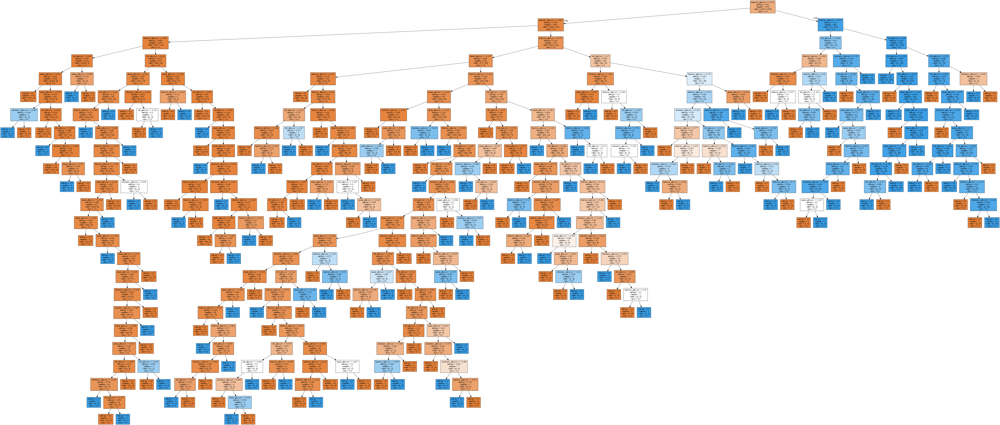

In [135]:
# Vizualizácia stromu
# Strom je príliš veľký - je vo formáte png, takže sa dá stiahnuť, po ktorom je po približení strom dobre čitateľný, 
# no nejde otvoriť na novej karte
graph = Source(export_graphviz(cls, 
                               out_file=None,
                               feature_names=['std_glucose', 'skewness_glucose', 'kurtosis_glucose', 'mean_glucose'],
                               class_names=['1.0', '0.0'],
                               filled = True))

display(Image(graph.pipe(format='png')))

In [136]:
# Vyhodnotíme natrénovaný model - accuracy, precision a recall metriky
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

# Použijeme validačné dáta
X_test = dfP_valid[['std_glucose', 'skewness_glucose', 'kurtosis_glucose', 'mean_glucose']].to_numpy()
Y_test = dfP_valid['class'].to_numpy()
y_pred = cls.predict(X_test)
acc_score = accuracy_score(Y_test, y_pred)
prec_score = precision_score(Y_test, y_pred, average="macro")
rec_score = recall_score(Y_test, y_pred, average="macro")
print("Accuracy: %f" % acc_score)
print("Precision: %f" % prec_score)
print("Recall: %f" % rec_score)

Accuracy: 0.935164
Precision: 0.920463
Recall: 0.911824


In [137]:
# Training score
cls.score(X_train, Y_train)

1.0

In [138]:
# Druhý rozhodovací strom
# Rovnaký postup, len použijeme atribúty s hodnotami kyslíka
cls2 = DecisionTreeClassifier(criterion='entropy')

features = dfP_train[['std_oxygen', 'skewness_oxygen', 'kurtosis_oxygen', 'mean_oxygen']].to_numpy()
X = features
target_label = dfP_train['class'].to_numpy()
Y = target_label

cls2 = cls2.fit(X, Y)
cls2

DecisionTreeClassifier(criterion='entropy')

In [139]:
graph = Source(export_graphviz(cls2, 
                               out_file=None,
                               feature_names=['std_oxygen', 'skewness_oxygen', 'kurtosis_oxygen', 'mean_oxygen'],
                               class_names=['1.0', '0.0'],
                               filled = True))

display(Image(graph.pipe(format='png')))

In [140]:
X_test = dfP_valid[['std_oxygen', 'skewness_oxygen', 'kurtosis_oxygen', 'mean_oxygen']].to_numpy()
Y_test = dfP_valid['class'].to_numpy()
y_pred = cls2.predict(X_test)
acc_score = accuracy_score(Y_test, y_pred)
prec_score = precision_score(Y_test, y_pred, average="macro")
rec_score = recall_score(Y_test, y_pred, average="macro")
print("Accuracy: %f" % acc_score)
print("Precision: %f" % prec_score)
print("Recall: %f" % rec_score)

Accuracy: 0.855835
Precision: 0.819669
Recall: 0.801854


In [141]:
cls2.score(X, Y)

0.999491482329011

## Optimalizácia hyperparametrov

In [142]:
# Zadefinujeme si dict hlavných hyperparametrov pre rozhodovací strom
# 1. criterion - funkcia na vyhodnotenie kvality rozdelenia
#              - môže byť gini alebo entropy - default=gini
# 2. max_depth - maximálna hĺbka stromu - default=None
# 3. min_samples_split - minimálny počet vzoriek požadovaných na rozdelenie vnútorného uzla - default=2
# 4. min_samples_leaf - minimálny počet vzoriek požadovaných byť na listovom uzle - default=1
param_dict = {
    "criterion":['gini', 'entropy'],
    "max_depth":range(1,20),
    "min_samples_split":range(1,20),
    "min_samples_leaf":range(1,5)
}

scoring = ['accuracy', 'precision_micro']

In [143]:
# Na nájdenie najlepších hyperparametrov použijeme GridSearchCV s 10 násobnou krížovou validáciou
# Použijeme to na náš prvý rozhodovací strom, kde sú ako features hodnoty glukózy
from sklearn.model_selection import GridSearchCV

grid = GridSearchCV(cls,
                   param_grid=param_dict,
                   cv=10,
                   scoring=scoring,
                   n_jobs=-1,
                   refit='accuracy')

grid.fit(X_train, Y_train)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(criterion='entropy'),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(1, 20),
                         'min_samples_leaf': range(1, 5),
                         'min_samples_split': range(1, 20)},
             refit='accuracy', scoring=['accuracy', 'precision_micro'])

In [144]:
# Najlepšie hyperparametre
grid.best_params_

{'criterion': 'gini',
 'max_depth': 4,
 'min_samples_leaf': 3,
 'min_samples_split': 2}

In [145]:
# Najlepší estimator
grid.best_estimator_

DecisionTreeClassifier(max_depth=4, min_samples_leaf=3)

In [146]:
# Najlepšie skóre
grid.best_score_

0.9560099972875576

In [147]:
# Spravíme rozhodovací strom s vylepšenými hyperparametrami
# Použijeme atribúty s nášho prvého rozhodovacieho stromu - teda glukózy a neskôr porovnáme výsledok
cls_best = DecisionTreeClassifier(criterion='gini', max_depth=4, min_samples_leaf=3, min_samples_split=2)

features = dfP_train[['std_glucose', 'skewness_glucose', 'kurtosis_glucose', 'mean_glucose']].to_numpy()
X_train = features
target_label = dfP_train['class'].to_numpy()
Y_train = target_label

cls_best = cls_best.fit(X_train, Y_train)
cls_best

DecisionTreeClassifier(max_depth=4, min_samples_leaf=3)

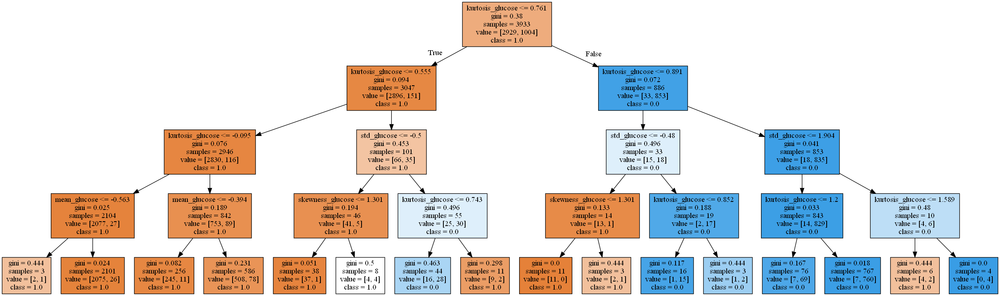

In [148]:
# Vidíme, že je o dosť menší - max_depth = 4
# Je možné ho už otvoriť na novej karte
graph = Source(export_graphviz(cls_best, 
                               out_file=None,
                               feature_names=['std_glucose', 'skewness_glucose', 'kurtosis_glucose', 'mean_glucose'],
                               class_names=['1.0', '0.0'],
                               filled = True))

display(Image(graph.pipe(format='png')))

In [149]:
# Znova vypočítame accuracy, precision a recall
# Vidíme cca 2% zlepšenie
X_test = dfP_valid[['std_glucose', 'skewness_glucose', 'kurtosis_glucose', 'mean_glucose']].to_numpy()
Y_test = dfP_valid['class'].to_numpy()
y_pred = cls_best.predict(X_test)
acc_score = accuracy_score(Y_test, y_pred)
prec_score = precision_score(Y_test, y_pred, average="macro")
rec_score = recall_score(Y_test, y_pred, average="macro")
print("Accuracy: %f" % acc_score)
print("Precision: %f" % prec_score)
print("Recall: %f" % rec_score)

Accuracy: 0.953471
Precision: 0.951298
Recall: 0.927955


In [150]:
# Accuracy metrika je takmer rovnaká pri testovacích a aj trénovacích dátach
# Hyperparametrami sme teda znížili overfitting a optimalizovali sme výsledok - right fit
cls_best.score(X_train, Y_train)

0.9598271039918638